# The Sounds of Manhattan

This is a small experiment meant to explore the relationship between architecture and music. Through a series of algorithms, I was able to convert ratios of building heights in Manhattan into musical notes.

I was inspired by the Theremin, an instrument that is controlled by your distance to an antenna. I took this a step further and imagined if you could fly over all of Manhattan and use the distances between you and the buildings as a way to create music. Luckily, we don't actually have to fly! Python does that for us instead.

# Setup

First, let's import a few libraries and define a few constants that will help us later on with the conversion between heights.

For data visualization and audio analysis we will use `Matplotlib`, `Librosa`, and `Music21`. For creation of midi files we use `Pyknon`. For parsing through the shapefile of Manhattan (which contains all of the metadata about every building/block), we use `Pyshp`.

In [23]:
import shapefile
import numpy as np
from numpy import log2, power
import matplotlib.pyplot as plt
import librosa
import matplotlib.pyplot as plt
import librosa.display
import wave
import sys

import IPython.display as ipd
from IPython.core.display import HTML
from IPython.display import Image
from scipy.io import wavfile

from pyknon.genmidi import Midi
from pyknon.music import NoteSeq, Note
from music21 import *

In [3]:
#Constants
#These are the pieces of metadata and their indices in the Manhattan Shape file.
META_DATA = {
    "ADDRESS": 15,
    "BLOCK": 1,
    "OWNER": 31,
    "HEIGHT": 50,
    "FRONT": 49,
    "XCOORD": 73,
    "YCOORD": 74
}

#Musical constants
#Note durations
QUARTER = 0.25
EIGHTH = QUARTER/2

#Middle C Hz
C4 = 261.63
#Middle A Hz
A4 = 440 
C0 = A4*power(2, -4.75)
ref_notes = ["C", "C#", "D", "D#", "E", "F", "F#", "G", "G#", "A", "A#", "B"]

# Musicology

My philosophy here was to compare height ratios to Middle C.

#### The frequency ($\lambda$) of a given building is the ratio between the height (H) of that building and the median height, multiplied by the frequency of middle C.

$$\lambda_{\ building} = \frac{H_{\ building}}{H_{\ median\ of\ all\ buildings}} * \lambda_{\ C4}$$

#### The "duration" (D) of a building is the ratio between the width (W) of that building and the median width, multiplied by the duration of an 8th note.

$$ D_{\ building} = \frac{W_{\ building}}{W_{\ median\ of\ all\ buildings}} * D_{\ 8th\ note} $$

## What does this mean?

What this implies is that basically, the ratio of a building relative to the median is how far that building is from Middle C. So very tall buildings are very high pitched, and short buildings are very low pitched. Buildings at or around the median more or less sound like Middle C.

Likewise, very wide buildings will last a long time, and shorter buildings won't. In this experiment, since we end up using Wall Street as an example, we multiply every width ratio times an Eighth note to help speed everything up a bit.

Of course, it would be possible to use the ratio between the building height and the average, or compare to the largest/smallest buildings, but I want to eventually explore correlations between building height ratios, corresponding musical pitch, and socioeconomic disparities.

Soon, I will explore the differences between using relative and absolute metrics for comparison. In particular, I want to compare the heights of buildings relative to the streets they're located on and see how that affects the key changes of the music over time.

$$\lambda_{building_{relative}} = \frac{H_{\ building}}{H_{\ median\ from\ building's\ street}} * \lambda_{C4}$$

Below are some functions written to facilitate the mathematical side of the data conversion.

In [4]:
### MUSIC DATA CONVERSION ###
def height_to_freq(height, median):
    """Takes a given height, the median for comparison,
    then converts it into a frequency"""
    #initialize ratio to 1 in case height is 0
    ratio = 1
    if height != 0:
        ratio = height / median
    return ratio * C4

def front_to_length(front, median):
    """Converts the length of the front of a building into the length of a note"""
    ratio = 1
    if front != 0:
        ratio = front/median
    return ratio * EIGHTH

def freq_to_note(freq):
    """Returns the note of a frequency"""
    pos = freq_to_position(freq)
    octave = freq_to_octave(freq)
    return ref_notes[pos] + str(octave)

def freq_to_position(freq):
    """Returns the position in the note array of a frequency"""
    h = round(12*log2(freq/C0))
    n = h % 12
    return int(n)

def freq_to_octave(freq):
    """Returns the octave of a frequency"""
    h = round(12*log2(freq/C0))
    octave = h // 12
    return int(octave)

In [5]:
### MIDI AND WAV DATA CREATION ###
def freq_to_midi(freq):
    """Converts a frequency to a midi number"""
    #MIDI num for A4: 69
    return 12*log2(freq/A4) + 69

def create_midi(sequence, filename = "test.midi"):
    """Creates a MIDI file from a given sequence of notes"""
    midi = Midi(1, tempo = 90)
    midi.seq_notes(sequence, track=0)
    midi.write(filename)

def play_midi(filepath):
    """Embeds a media player to display the MIDI file"""
    mf = midi.MidiFile()
    mf.open(filepath)
    mf.read()
    mf.close()
    s = midi.translate.midiFileToStream(mf)
    s.show('midi')

# Where do we get the heights from?

I downloaded a shapefile from the NYC Planning website here:

https://www1.nyc.gov/site/planning/data-maps/open-data/dwn-pluto-mappluto.page

From here, I simply wrote a few functions to aggregate the relevant data, particuarly organized by street. Then, I wrote a few general functions that would sort given building's within a street by x coordinate, since successive addresses are not necessarily geographically sequential.

In [6]:
### GEOSPATIAL DATA ANALYSIS ###
def get_all_street_data(records, *args):
    """Takes in shape records and returns all of
    the streets and corresponding metadata""" 
    groups= {}
    for street in get_all_streets(records):
        groups[street] = []

    #forms the groups
    for r in records:
        address = r.record[META_DATA["ADDRESS"]]
        for street in groups:
            if street in address:
                groups[street].append(sr_to_metadata(r))

    return groups

def get_street_data_byname(street_data, street_name):
    """Returns all of the records along a particular street"""
    sr = street_data[street_name]
    return sr

def get_all_streets(records):
    """Returns all street names"""
    streets = []
    for r in records:
        addr = r.record[META_DATA["ADDRESS"]]
        street = addr.split(" ", 1)[-1]
        if street not in streets:
            streets.append(street)
    return streets

In [7]:
#METADATA METHODS 
def sort_by_metadata(street_data, metadata):
    """Sorts a given set of street data by any piece of metadata"""
    data = {}
    for i in range(0, len(street_data)):
        data[i] = street_data[i][metadata]

    #has the indices
    sorted_data = sorted(data.iteritems(), key=lambda (k,v): (v,k))
    sorted_final = [0] * len(street_data)

    for i in range(0, len(sorted_data)):
        sorted_final[i] = street_data[sorted_data[i][0]]

    return sorted_final

def sr_to_metadata(sr):
    """Converts a given shape record to its metadata object"""
    data = {}
    for attr, index in META_DATA.items():
        data[attr] = sr.record[index]
    return data

def print_metadata_id(records, *args):
    """Prints the relevant metadata about specified records"""
    for arg in args:
        print("\n")
        r = records[arg]
        for attr, index in META_DATA.items():
            print("{}: {}".format(attr, r.record[index]))

def print_metadata_all(records):
    """Prints all metadata from a given set of shape records"""
    for r in records:
        print("\n")
        for attr, index in META_DATA.items():
            print("{}: {}".format(attr, r.record[index]))

def get_metadata_measure(records, func, metadata):
    """Takes in shape records and a function, either max,
    min, median, or avg, then returns the processed data"""
    
    #Reference each height by the record index
    measure_dic = {}

    for i in range(0, len(records)):
        measure_dic[i] = records[i].record[META_DATA[metadata]]

    measures = measure_dic.values()
    to_return = 0

    #Different statistics on building heights
    if func == "max":
        to_return = max(measures)
    elif func == "min":
        to_return = min(measures)
    elif func == "median":
        to_return = np.median(measures)
    else:
        to_return = np.mean(measures)
    return to_return

In [8]:
def init_shapefile(path):
    """Initializes a shapefile for reading/parsing"""
    return shapefile.Reader(path)

In [9]:
#Initialize the data sources
sf = init_shapefile("mn_mappluto_16v2/MNMapPLUTO")
sr = sf.shapeRecords()

In [10]:
median_height = get_metadata_measure(sr, "median", "HEIGHT")
median_front = get_metadata_measure(sr, "median", "FRONT")

# Testing on Wall Street

There are hundreds of streets in Manhattan, so filling a Jupyter notebook with tens of thousands of notes would be ridiculous. So, let's check out Wall Street. 

In [11]:
#Testing with wall street and sorting by the X coordinates
#First grab all street data
street_data = get_all_street_data(sr)

#Specific further by grabbing only wall street
wall_street = get_street_data_byname(street_data, 'WALL STREET')

#Sort the wall street by decreasing X coordinate
sorted_wall_street = sort_by_metadata(wall_street, 'XCOORD')

In [34]:
#empty melody array
notes = NoteSeq()

#wall street test
for building in sorted_wall_street:
    
    #Grab the height and front of each building
    height = building['HEIGHT']
    front = building['FRONT']   
    
    #Get the music specific metadata for each building:
    freq = height_to_freq(height, median_height)
    position = freq_to_position(freq)
    octave = freq_to_octave(freq)
    duration = front_to_length(front, median_front)
    
    #TODO: Get the actual volume of the building by multiplying height by area
    volume = 100
    
    #Create a note object using each piece of metadata
    note = Note(position, octave, duration, volume)    
    notes.append(note)
    
    #All relevant metadata
    print("{} | Height: {} | Width: {} | Note: {} | Dur: {} | Octave: {}".format(building['ADDRESS'], height, front, note, note.dur, note.octave))

2 WALL STREET | Height: 72.33 | Width: 114.58 | Note: <C> | Dur: 0.5729 | Octave: 4
14 WALL STREET | Height: 196.25 | Width: 160.0 | Note: <F> | Dur: 0.8 | Octave: 5
26 WALL STREET | Height: 170.0 | Width: 90.0 | Note: <D> | Dur: 0.45 | Octave: 5
37 WALL STREET | Height: 220.0 | Width: 61.08 | Note: <G> | Dur: 0.3054 | Octave: 5
30 WALL STREET | Height: 120.83 | Width: 86.67 | Note: <G#> | Dur: 0.43335 | Octave: 4
45 WALL STREET | Height: 185.0 | Width: 107.0 | Note: <E> | Dur: 0.535 | Octave: 5
40 WALL STREET | Height: 194.58 | Width: 150.0 | Note: <F> | Dur: 0.75 | Octave: 5
44 WALL STREET | Height: 195.0 | Width: 70.0 | Note: <F> | Dur: 0.35 | Octave: 5
55 WALL STREET | Height: 171.0 | Width: 204.0 | Note: <D#> | Dur: 1.02 | Octave: 5
48 WALL STREET | Height: 127.0 | Width: 99.0 | Note: <A> | Dur: 0.495 | Octave: 4
63 WALL STREET | Height: 213.17 | Width: 112.5 | Note: <F#> | Dur: 0.5625 | Octave: 5
60 WALL STREET | Height: 195.0 | Width: 296.0 | Note: <F> | Dur: 1.48 | Octave: 5
67

# The results

After running through all of the data and creating the appropriate notes, we end up with a pretty ominous sounding movie sound track. First is the unedited MIDI file, then the processed MIDI edited with some dank synthesizers in Logic Pro X.

## The score

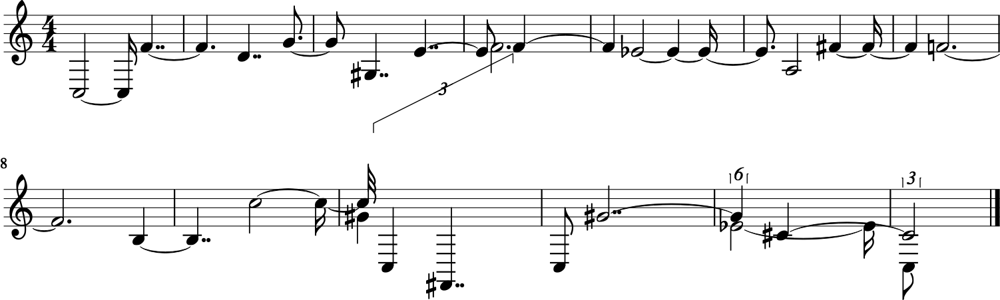

In [217]:
#Converting midi into notes
c = converter.parse('./wallstreet_test2.mid')
c.show()

## MIDI creation

In [13]:
#Create the unedited MIDI file
create_midi(notes, "./wallstreet_test2.mid")
play_midi("./wallstreet_test2.mid")

In [21]:
#Processed MIDI, edited in logic with a few Synthesizers and turned into a WAV.
ipd.Audio('./wallstreet_test2.wav')

## Wave plot

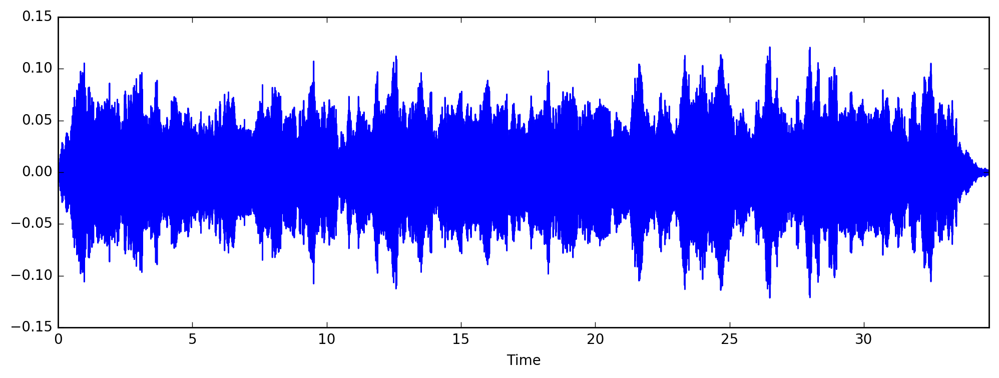

In [22]:
#Audio analysis of the edited WAV.
x, sr = librosa.load('./wallstreet_test2.wav')
plt.figure(figsize=(12, 4))
librosa.display.waveplot(x, sr=sr)

## Spectrometry

Notice how the patterns here eerily resemble the buildings on Wall Street.

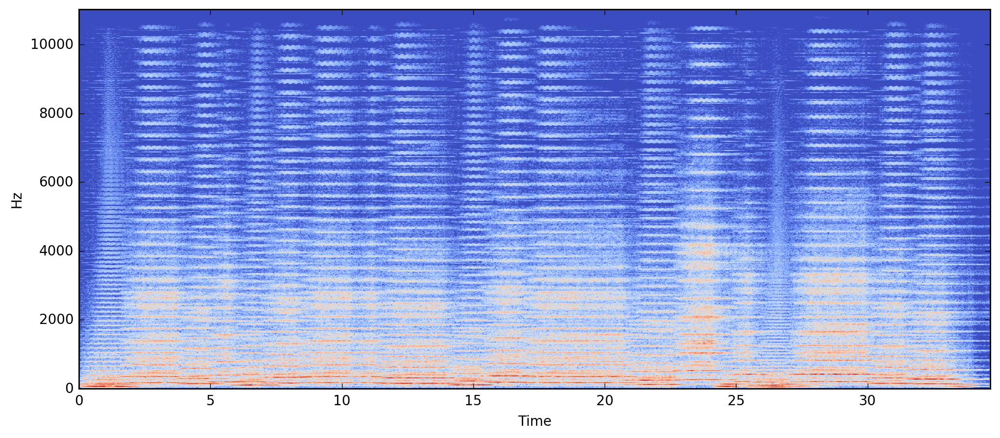

In [235]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(X)
plt.figure(figsize=(12, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')

## Other data viz

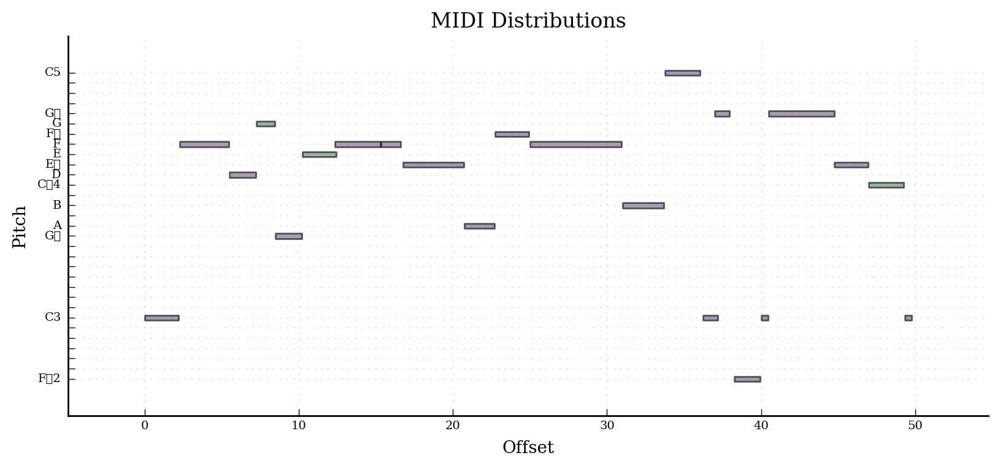

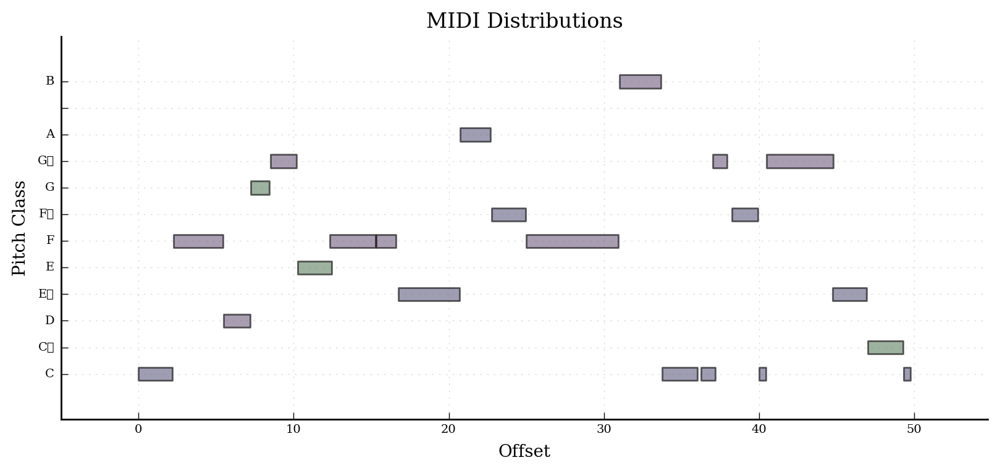

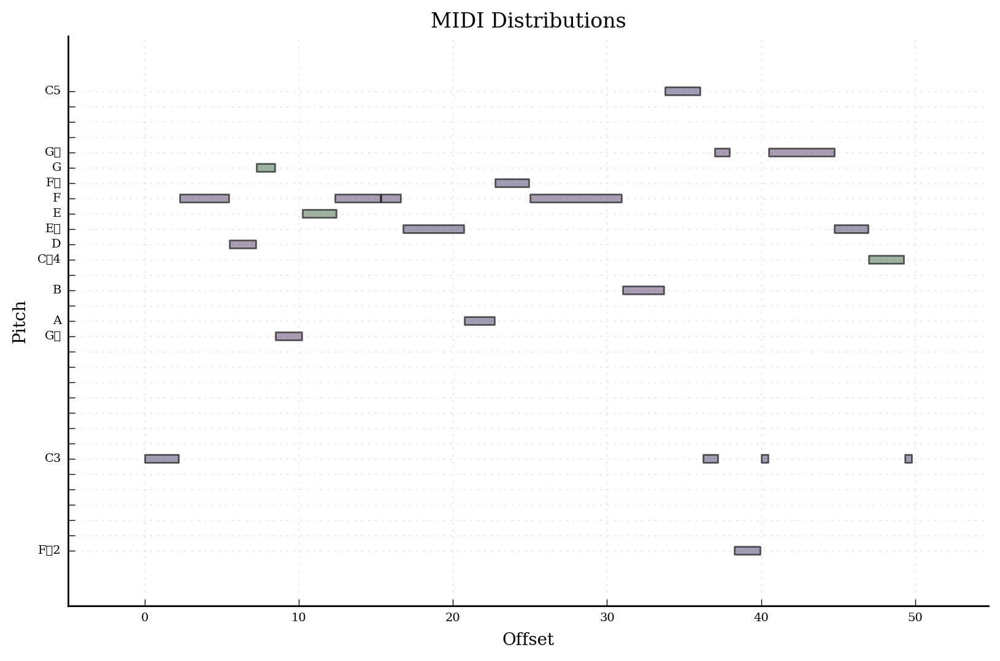

In [226]:
c.plot('horizontalbar', title = "MIDI Distributions")

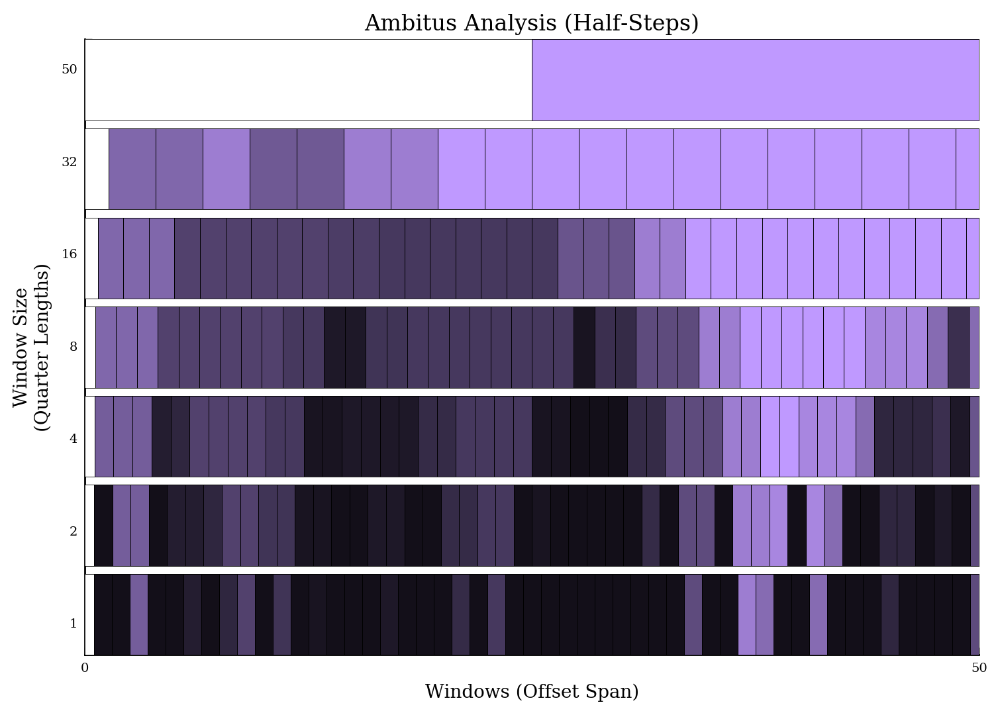

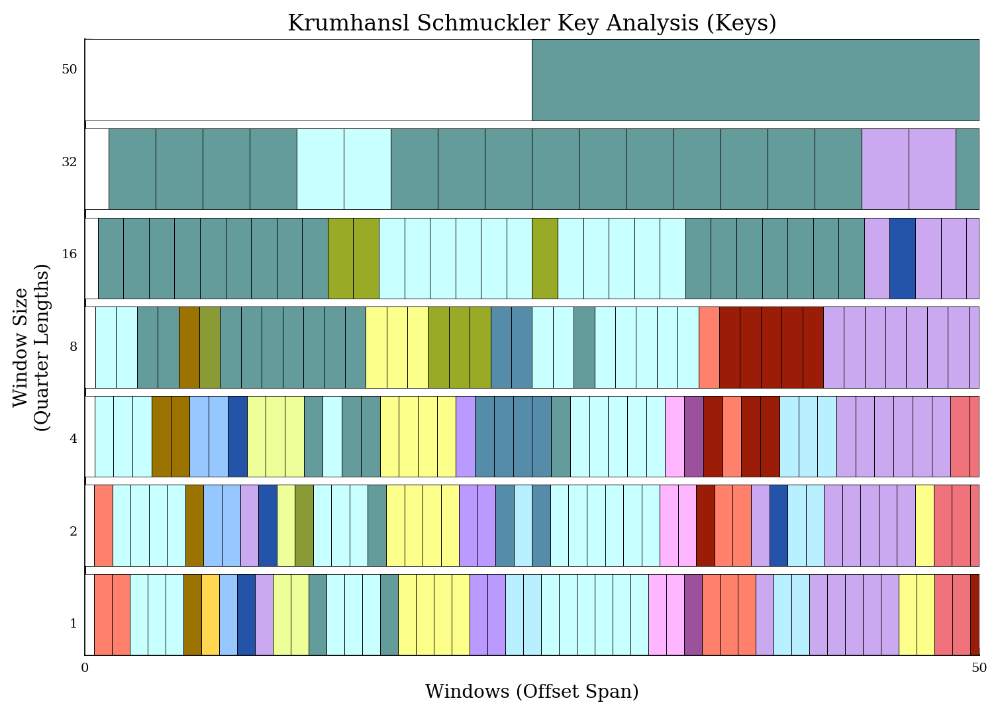

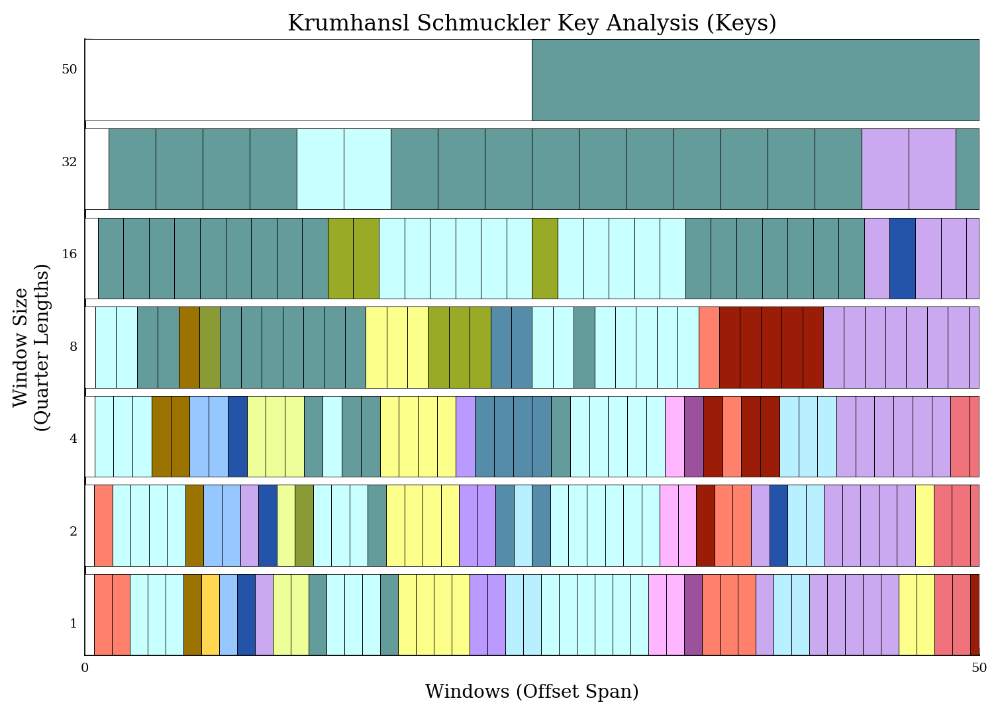

In [215]:
c.plot('colorgrid')